In [1]:
# Cell 1
import os, random
import math
import pandas as pd
import numpy as np
import torch

from datasets import Dataset, DatasetDict
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

from transformers import (
    AutoTokenizer, AutoConfig, AutoModelForSequenceClassification,
    DataCollatorWithPadding, TrainingArguments, Trainer, EarlyStoppingCallback
)

import matplotlib.pyplot as plt


In [2]:
# Cell 2
SEED = 42
DATA_CSV = "filtered_dataset.csv"
TEXT_COL = "post"
LABEL_COL = "label"

MODEL_NAME = "distilbert-base-uncased"
MAX_LEN = 256

# GPU-friendly (you said RTX 4060 handles 32)
PER_DEVICE_TRAIN_BATCH = 32
PER_DEVICE_EVAL_BATCH  = 32
GRADIENT_ACCUMULATION  = 1

EPOCHS = 10            # allow up to 10; early stopping will stop earlier
LEARNING_RATE = 2e-5
WEIGHT_DECAY = 0.01

OUTPUT_DIR = "distilbert_optimized_runs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
 torch.cuda.manual_seed_all(SEED)


In [3]:
# Cell 3
df = pd.read_csv(DATA_CSV)
df = df.dropna(subset=[TEXT_COL, LABEL_COL]).reset_index(drop=True)
print("Loaded rows:", len(df))
print("Columns:", df.columns.tolist())
print("Label distribution:\n", df[LABEL_COL].value_counts())

# Label encoding
le = LabelEncoder()
df["label_encoded"] = le.fit_transform(df[LABEL_COL].astype(str))
num_labels = len(le.classes_)
class_names = list(le.classes_)
print("num_labels:", num_labels)
print("class_names:", class_names)


Loaded rows: 457255
Columns: ['label', 'author', 'date', 'post', 'automated_readability_index', 'coleman_liau_index', 'flesch_kincaid_grade_level', 'flesch_reading_ease', 'gulpease_index', 'gunning_fog_index', 'lix', 'smog_index', 'wiener_sachtextformel', 'n_chars', 'n_long_words', 'n_monosyllable_words', 'n_polysyllable_words', 'n_sents', 'n_syllables', 'n_unique_words', 'n_words', 'sent_neg', 'sent_neu', 'sent_pos', 'sent_compound', 'economic_stress_total', 'isolation_total', 'substance_use_total', 'guns_total', 'domestic_stress_total', 'suicidality_total', 'punctuation', 'liwc_1st_pers', 'liwc_2nd_pers', 'liwc_3rd_pers', 'liwc_achievement', 'liwc_adverbs', 'liwc_affective_processes', 'liwc_anger', 'liwc_anxiety', 'liwc_articles_article', 'liwc_assent', 'liwc_auxiliary_verbs', 'liwc_biological', 'liwc_body', 'liwc_causation', 'liwc_certainty', 'liwc_cognitive', 'liwc_common_verbs', 'liwc_conjunctions', 'liwc_death', 'liwc_discrepancy', 'liwc_exclusive', 'liwc_family', 'liwc_feel', 'l

In [4]:
# Cell 4
# First split out test (20%)
idx = df.index.values
temp_idx, test_idx = train_test_split(idx, test_size=0.20, stratify=df["label_encoded"], random_state=SEED)

# Now split temp into train + val, so val ~= 10% of full data
train_idx, val_idx = train_test_split(temp_idx, test_size=0.125, stratify=df.loc[temp_idx, "label_encoded"], random_state=SEED)

train_df = df.loc[train_idx].reset_index(drop=True)
val_df   = df.loc[val_idx].reset_index(drop=True)
test_df  = df.loc[test_idx].reset_index(drop=True)

print("train / val / test sizes:", len(train_df), len(val_df), len(test_df))

# Create HuggingFace Datasets
ds_train = Dataset.from_pandas(train_df[[TEXT_COL, "label_encoded"]].rename(columns={TEXT_COL:"text","label_encoded":"labels"}))
ds_val   = Dataset.from_pandas(val_df[[TEXT_COL, "label_encoded"]].rename(columns={TEXT_COL:"text","label_encoded":"labels"}))
ds_test  = Dataset.from_pandas(test_df[[TEXT_COL, "label_encoded"]].rename(columns={TEXT_COL:"text","label_encoded":"labels"}))

full_dataset = DatasetDict({"train": ds_train, "validation": ds_val, "test": ds_test})


train / val / test sizes: 320078 45726 91451


In [5]:
# Cell 5
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, use_fast=True)

def tokenize_fn(batch):
    return tokenizer(batch["text"], truncation=True, max_length=MAX_LEN)

# Tokenize and set format (this can take time but run once)
full_tok = full_dataset.map(tokenize_fn, batched=True, remove_columns=["text"])
full_tok.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])
print("Tokenized sizes:", {k: len(v) for k, v in full_tok.items()})
# Optional: cache to disk to avoid re-tokenizing in future sessions:
# full_tok.save_to_disk("tokenized_filtered_dataset")


Map:   0%|          | 0/320078 [00:00<?, ? examples/s]

Map:   0%|          | 0/45726 [00:00<?, ? examples/s]

Map:   0%|          | 0/91451 [00:00<?, ? examples/s]

Tokenized sizes: {'train': 320078, 'validation': 45726, 'test': 91451}


In [6]:
# Cell 6
train_labels = np.array(full_tok["train"]["labels"])
classes = np.arange(num_labels)
cw = compute_class_weight(class_weight="balanced", classes=classes, y=train_labels)
class_weights = torch.tensor(cw, dtype=torch.float)
print("Class weights:", cw)

Class weights: [3.98925656 0.66803999 5.15672628 0.52857402 3.43726375 5.27398253
 1.25483877 0.25980779 3.52528223 1.28980496 0.67246103 3.5270303
 3.49869377 1.32562175 0.46074608]


In [7]:
# Cell 7
from dataclasses import dataclass
from typing import Optional

@dataclass
class WeightedTrainer(Trainer):
    class_weights: Optional[torch.Tensor] = None

    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.get("labels")
        # forward pass (without labels so we get logits)
        outputs = model(**{k:v for k,v in inputs.items() if k != "labels"})
        logits = outputs.logits
        # apply class weights if provided
        if self.class_weights is not None:
            cw = self.class_weights.to(logits.device)
            loss_fct = torch.nn.CrossEntropyLoss(weight=cw)
        else:
            loss_fct = torch.nn.CrossEntropyLoss()
        loss = loss_fct(logits.view(-1, logits.size(-1)), labels.view(-1))
        return (loss, outputs) if return_outputs else loss


In [8]:
# Cell 8
cfg = AutoConfig.from_pretrained(MODEL_NAME, num_labels=num_labels, id2label={i: n for i,n in enumerate(class_names)},
                                  label2id={n: i for i,n in enumerate(class_names)})
# small config tweaks to encourage generalization
# (many HF model implementations read these fields)
cfg.dropout = 0.3
cfg.attention_dropout = 0.3

model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, config=cfg)
# optional: reduce memory by gradient checkpointing
try:
    model.gradient_checkpointing_enable()
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("Model loaded on", device)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded on cuda


In [9]:
from transformers import Trainer
import torch

class WeightedTrainer(Trainer):
    def __init__(self, class_weights=None, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        labels = inputs.get("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        # Apply class weights if available
        if self.class_weights is not None:
            loss_fct = torch.nn.CrossEntropyLoss(weight=self.class_weights.to(model.device))
        else:
            loss_fct = torch.nn.CrossEntropyLoss()

        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))
        return (loss, outputs) if return_outputs else loss



In [10]:
# Cell 9
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

training_args = TrainingArguments(
    output_dir=os.path.join(OUTPUT_DIR, "distilbert-best"),
    per_device_train_batch_size=PER_DEVICE_TRAIN_BATCH,
    per_device_eval_batch_size=PER_DEVICE_EVAL_BATCH,
    gradient_accumulation_steps=GRADIENT_ACCUMULATION,
    dataloader_num_workers=4,
    dataloader_pin_memory=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="steps",
    logging_steps=100,
    learning_rate=LEARNING_RATE,
    warmup_ratio=0.06,
    weight_decay=WEIGHT_DECAY,
    num_train_epochs=EPOCHS,
    fp16=torch.cuda.is_available(),
    seed=SEED,
    load_best_model_at_end=True,
    metric_for_best_model="f1_weighted",
    save_total_limit=3,
    report_to=[]  # disable remote logging (optional)
)

trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=full_tok["train"],
    eval_dataset=full_tok["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=lambda pred: {
        "accuracy": accuracy_score(pred.label_ids, np.argmax(pred.predictions, axis=1)),
        "precision": precision_score(pred.label_ids, np.argmax(pred.predictions, axis=1), average="weighted", zero_division=0),
        "recall": recall_score(pred.label_ids, np.argmax(pred.predictions, axis=1), average="weighted", zero_division=0),
        "f1_weighted": f1_score(pred.label_ids, np.argmax(pred.predictions, axis=1), average="weighted")
    },
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2)],
    class_weights=class_weights
)


print("Trainer ready. GPU:", torch.cuda.is_available())


Trainer ready. GPU: True


C:\Users\ankit\AppData\Local\Temp\ipykernel_17636\3418192249.py:6: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `WeightedTrainer.__init__`. Use `processing_class` instead.
  super().__init__(*args, **kwargs)


In [ ]:
# Cell 10
# If you want to resume from a checkpoint use trainer.train(resume_from_checkpoint=True)
trainer.train()
trainer.save_model(training_args.output_dir)
print("Training finished. Model saved to:", training_args.output_dir)


Classification Report:

               precision    recall  f1-score   support

    addiction       0.08      0.00      0.00      1528
         adhd       0.00      0.00      0.00      9126
   alcoholism       0.00      0.00      0.00      1182
      anxiety       0.14      0.30      0.19     11534
       autism       0.00      0.00      0.00      1774
bipolarreddit       0.00      0.00      0.00      1156
          bpd       0.00      0.00      0.00      4859
   depression       0.00      0.00      0.00     23466
healthanxiety       0.00      0.00      0.00      1730
       lonely       0.04      0.52      0.08      4727
 mentalhealth       0.20      0.00      0.00      9067
         ptsd       0.00      0.00      0.00      1729
schizophrenia       0.00      0.00      0.00      1742
socialanxiety       0.09      0.16      0.11      4599
 suicidewatch       0.00      0.00      0.00     13232

     accuracy                           0.07     91451
    macro avg       0.04      0.06     

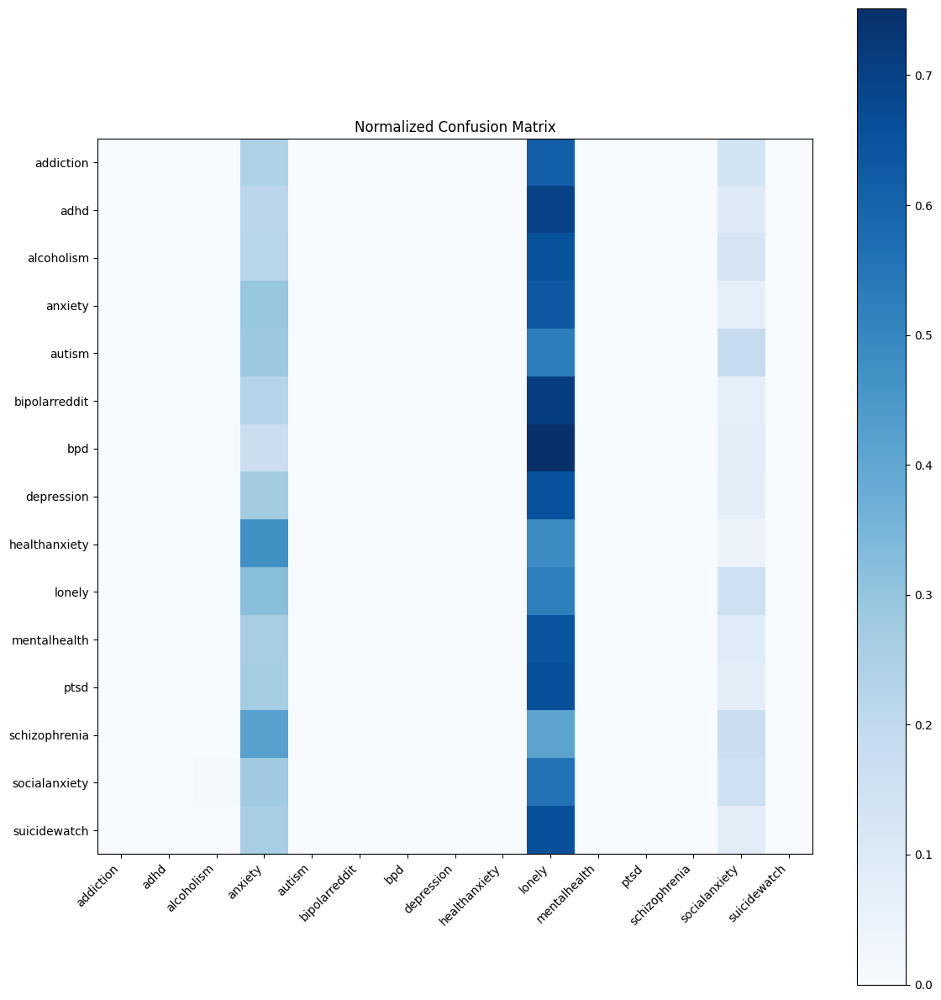

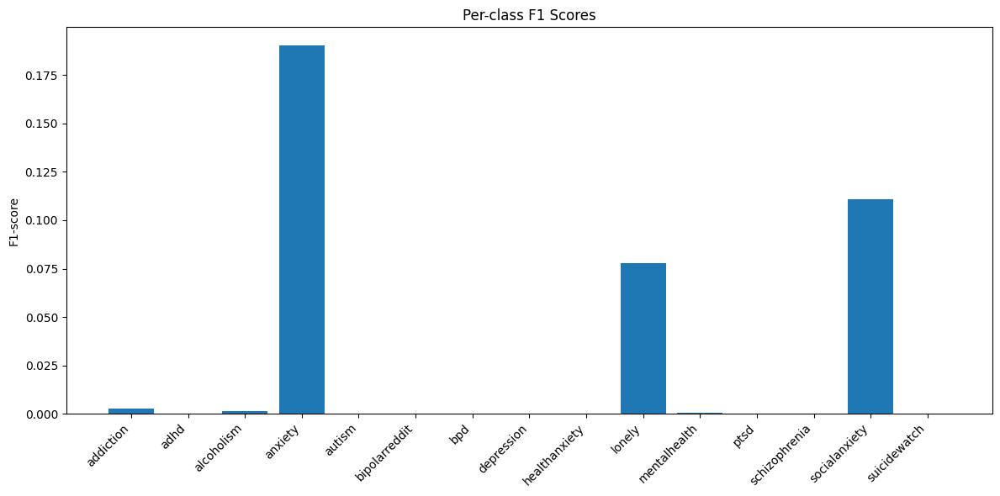

In [11]:
# Cell 11
preds = trainer.predict(full_tok["test"])
y_true = preds.label_ids
y_pred = np.argmax(preds.predictions, axis=1)

# Classic ML-style report (precision/recall/f1)
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

# Confusion matrix (normalized)
cm = confusion_matrix(y_true, y_pred, normalize="true")
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(cm, interpolation='nearest', cmap="Blues")
ax.set_xticks(np.arange(len(class_names)))
ax.set_yticks(np.arange(len(class_names)))
ax.set_xticklabels(class_names, rotation=45, ha="right")
ax.set_yticklabels(class_names)
plt.colorbar(im, ax=ax)
ax.set_title("Normalized Confusion Matrix")
plt.tight_layout()
plt.show()

# Per-class F1 bar chart
report_dict = classification_report(y_true, y_pred, target_names=class_names, output_dict=True, zero_division=0)
f1_scores = [report_dict[c]["f1-score"] for c in class_names]

plt.figure(figsize=(12,6))
plt.bar(class_names, f1_scores)
plt.xticks(rotation=45, ha="right")
plt.ylabel("F1-score")
plt.title("Per-class F1 Scores")
plt.tight_layout()
plt.show()


In [12]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# Path where your best model was saved
best_model_dir = "distilbert_optimized_runs/distilbert-best"

# Reload tokenizer & model
tokenizer = AutoTokenizer.from_pretrained(best_model_dir)
model = AutoModelForSequenceClassification.from_pretrained(best_model_dir)

# Put model on GPU if available
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

print("✅ Best model reloaded from:", best_model_dir)



✅ Best model reloaded from: distilbert_optimized_runs/distilbert-best


In [13]:
def predict(text):
    inputs = tokenizer(text, truncation=True, padding=True, max_length=256, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    pred_class = torch.argmax(probs, dim=-1).item()
    return pred_class, probs.cpu().numpy()

sample_text = "I am feeling very low and anxious these days."
label_id, probabilities = predict(sample_text)

print("Predicted label:", label_id)
print("Probabilities:", probabilities)


Predicted label: 10
Probabilities: [[0.00204102 0.00763377 0.00114244 0.21571918 0.00356319 0.0100862
  0.02813291 0.21448384 0.01559574 0.03780604 0.34034863 0.00197043
  0.01281492 0.02376845 0.0848932 ]]


In [14]:
from transformers import pipeline
import shap
import matplotlib.pyplot as plt
import numpy as np
from lime.lime_text import LimeTextExplainer
import torch

# ----------------------------
# Define your class mapping (update if label order differs in your dataset)
# ----------------------------
class_mapping = {
    0: "addiction", 1: "adhd", 2: "alcoholism", 3: "anxiety", 4: "autism",
    5: "bipolarreddit", 6: "bpd", 7: "depression", 8: "healthanxiety", 9: "lonely",
    10: "mentalhealth", 11: "ptsd", 12: "schizophrenia", 13: "socialanxiety", 14: "suicidewatch"
}

# ----------------------------
# Build Hugging Face pipeline with your trained model
# ----------------------------
nlp_pipeline = pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0 if torch.cuda.is_available() else -1,
    return_all_scores=True
)

# Wrap predict_proba for SHAP/LIME
def predict_proba(texts):
    outputs = [nlp_pipeline(t)[0] for t in texts]
    probs = []
    for out in outputs:
        # Sort outputs by label to align with class_mapping keys
        sorted_out = sorted(out, key=lambda x: x['label'])
        probs.append([x['score'] for x in sorted_out])
    return np.array(probs)

# SHAP Explainer
explainer = shap.Explainer(nlp_pipeline)

# LIME Explainer
class_names = list(class_mapping.values())
lime_explainer = LimeTextExplainer(class_names=class_names)

# ----------------------------
# Main function
# ----------------------------
def explain_prediction_dl(input_text, mode="both", top_n=10):
    """
    Explain DistilBERT predictions with SHAP, LIME, or both.
    mode: "shap", "lime", or "both"
    Works with single sentence, multiple sentences, or long paragraphs.
    """
    if isinstance(input_text, str):
        texts = [input_text]
    else:
        texts = input_text

    # ------------------------
    # Get predictions
    # ------------------------
    probs = predict_proba(texts)
    for i, text in enumerate(texts):
        prob = probs[i]
        pred_idx = np.argmax(prob)
        pred_class = class_mapping[pred_idx]
        pred_score = prob[pred_idx] * 100
        
        print("=" * 60)
        print(f"Text {i+1}: {text}\n")
        print(f"Predicted Condition: {pred_class} ({pred_score:.2f}%)")
        print("Prediction Probabilities (top 5):")
        top5 = sorted(list(enumerate(prob)), key=lambda x: x[1], reverse=True)[:5]
        for j, p in top5:
            marker = "<-- Main Prediction" if class_mapping[j] == pred_class else ""
            print(f"  {class_mapping[j]}: {p:.3f} {marker}")

        # ------------------------
        # LIME Explanation
        # ------------------------
        if mode in ["lime", "both"]:
            print("\n🔹 LIME Explanation (word-level, easy to read):")
            exp = lime_explainer.explain_instance(
                text, predict_proba, num_features=top_n, labels=[pred_idx]
            )
            
            # Text explanation
            for word, weight in exp.as_list(label=pred_idx):
                direction = "supports" if weight > 0 else "opposes"
                print(f"  - '{word}' {direction} prediction of '{pred_class}' (score={weight:.3f})")
            
            # Visual explanation
            exp.show_in_notebook(text=True)

        # ------------------------
        # SHAP Explanation
        # ------------------------
        if mode in ["shap", "both"]:
            print("\n🔹 SHAP Explanation (token-level, deep dive):")
            shap_values = explainer([text])

            # Interactive SHAP text plot
            shap.plots.text(shap_values[0])

            # Bar chart (top tokens)
            token_scores = shap_values.values[0].sum(axis=1)
            tokens = shap_values.data[0]
            n_top = min(top_n, len(tokens))
            top_idx = np.argsort(np.abs(token_scores))[-n_top:]

            plt.figure(figsize=(8,4))
            colors = ["green" if s > 0 else "red" for s in token_scores[top_idx]]
            plt.barh(np.array(tokens)[top_idx], token_scores[top_idx], color=colors)
            plt.xlabel("Contribution Score")
            plt.title(f"Top {n_top} tokens contributing to '{pred_class}' (SHAP)")
            plt.show()

            # Text summary
            print("\nTop contributing tokens (SHAP textual explanation):")
            for j in top_idx[::-1]:
                direction = "supports" if token_scores[j] > 0 else "opposes"
                print(f"  - '{tokens[j]}' {direction} prediction of '{pred_class}' (score={token_scores[j]:.3f})")

        # ------------------------
        # Summary
        # ------------------------
        print(f"\n✅ Summary: The model predicts '{pred_class}' with {pred_score:.2f}% confidence.\n")


Device set to use cuda:0
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\transformers\pipelines\text_classification.py:111: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


Text 1: I am feeling very low and anxious these days.

Predicted Condition: mentalhealth (34.03%)
Prediction Probabilities (top 5):
  mentalhealth: 0.340 <-- Main Prediction
  anxiety: 0.216 
  depression: 0.214 
  suicidewatch: 0.085 
  lonely: 0.038 

🔹 LIME Explanation (word-level, easy to read):
  - 'low' supports prediction of 'mentalhealth' (score=0.099)
  - 'feeling' supports prediction of 'mentalhealth' (score=0.089)
  - 'and' supports prediction of 'mentalhealth' (score=0.077)
  - 'very' supports prediction of 'mentalhealth' (score=0.064)
  - 'am' supports prediction of 'mentalhealth' (score=0.060)
  - 'days' opposes prediction of 'mentalhealth' (score=-0.048)
  - 'I' supports prediction of 'mentalhealth' (score=0.038)
  - 'anxious' opposes prediction of 'mentalhealth' (score=-0.011)
  - 'these' supports prediction of 'mentalhealth' (score=0.008)



🔹 SHAP Explanation (token-level, deep dive):


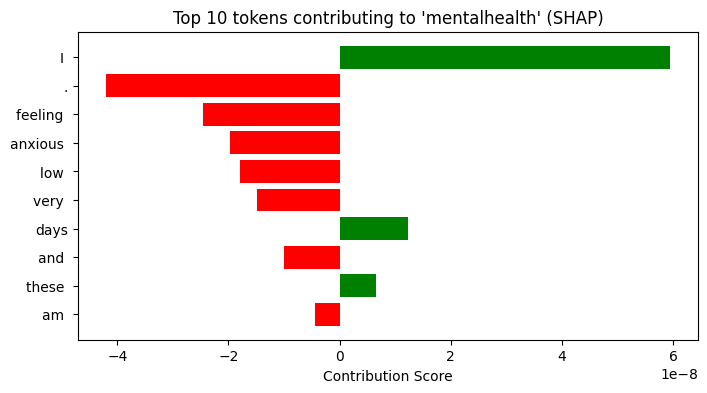


Top contributing tokens (SHAP textual explanation):
  - 'I ' supports prediction of 'mentalhealth' (score=0.000)
  - '.' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'feeling ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'anxious ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'low ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'very ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'days' supports prediction of 'mentalhealth' (score=0.000)
  - 'and ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'these ' supports prediction of 'mentalhealth' (score=0.000)
  - 'am ' opposes prediction of 'mentalhealth' (score=-0.000)

✅ Summary: The model predicts 'mentalhealth' with 34.03% confidence.



In [15]:
explain_prediction_dl("I am feeling very low and anxious these days.",mode ="both")


In [ ]:
sample_texts = [
    "I am feeling very low and anxious these days.",
    "Today was an amazing and joyful day!",
    "Sometimes I get panic attacks in public places.",
    "I feel hopeful and positive about my future."
]
explain_prediction_dl(sample_texts)


Text 1: 
Some days I feel unstoppable, energized, and overly confident, taking impulsive risks. 
Other days, I’m lethargic, hopeless, and unable to complete basic tasks. 
My mood swings unpredictably, leaving me exhausted and confused.


Predicted Condition: adhd (44.96%)
Prediction Probabilities (top 5):
  adhd: 0.450 <-- Main Prediction
  bpd: 0.273 
  mentalhealth: 0.202 
  depression: 0.045 
  anxiety: 0.015 

🔹 LIME Explanation (word-level, easy to read):
  - 'impulsive' supports prediction of 'adhd' (score=0.275)
  - 'energized' supports prediction of 'adhd' (score=0.221)
  - 'tasks' supports prediction of 'adhd' (score=0.200)
  - 'swings' opposes prediction of 'adhd' (score=-0.168)
  - 'I' opposes prediction of 'adhd' (score=-0.114)
  - 'My' opposes prediction of 'adhd' (score=-0.102)
  - 'unstoppable' opposes prediction of 'adhd' (score=-0.101)
  - 'feel' opposes prediction of 'adhd' (score=-0.097)
  - 'mood' supports prediction of 'adhd' (score=0.082)
  - 'overly' supports pre


🔹 SHAP Explanation (token-level, deep dive):


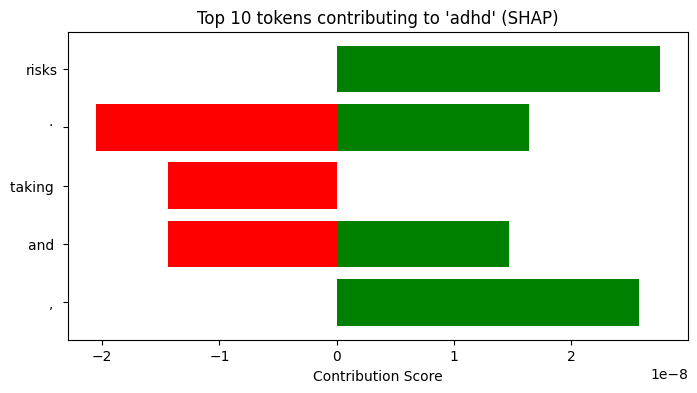


Top contributing tokens (SHAP textual explanation):
  - 'risks' supports prediction of 'adhd' (score=0.000)
  - ', ' supports prediction of 'adhd' (score=0.000)
  - '. 
' opposes prediction of 'adhd' (score=-0.000)
  - ', ' supports prediction of 'adhd' (score=0.000)
  - '. 
' supports prediction of 'adhd' (score=0.000)
  - 'and ' supports prediction of 'adhd' (score=0.000)
  - 'taking ' opposes prediction of 'adhd' (score=-0.000)
  - 'and ' opposes prediction of 'adhd' (score=-0.000)
  - ', ' supports prediction of 'adhd' (score=0.000)
  - ', ' supports prediction of 'adhd' (score=0.000)

✅ Summary: The model predicts 'adhd' with 44.96% confidence.



In [16]:
explain_prediction_dl("""
Some days I feel unstoppable, energized, and overly confident, taking impulsive risks. 
Other days, I’m lethargic, hopeless, and unable to complete basic tasks. 
My mood swings unpredictably, leaving me exhausted and confused.
""", mode="both")


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


Text 1: 
I am exremely happy today and looking forward to the future!


Predicted Condition: mentalhealth (36.40%)
Prediction Probabilities (top 5):
  mentalhealth: 0.364 <-- Main Prediction
  bpd: 0.268 
  depression: 0.210 
  anxiety: 0.072 
  schizophrenia: 0.048 

🔹 LIME Explanation (word-level, easy to read):
  - 'happy' supports prediction of 'mentalhealth' (score=0.110)
  - 'future' supports prediction of 'mentalhealth' (score=0.082)
  - 'forward' supports prediction of 'mentalhealth' (score=0.068)
  - 'and' supports prediction of 'mentalhealth' (score=0.067)
  - 'am' supports prediction of 'mentalhealth' (score=0.039)
  - 'exremely' supports prediction of 'mentalhealth' (score=0.035)
  - 'today' supports prediction of 'mentalhealth' (score=0.012)
  - 'the' opposes prediction of 'mentalhealth' (score=-0.011)
  - 'to' opposes prediction of 'mentalhealth' (score=-0.004)
  - 'I' supports prediction of 'mentalhealth' (score=0.003)



🔹 SHAP Explanation (token-level, deep dive):


PartitionExplainer explainer: 2it [00:10, 10.11s/it]               


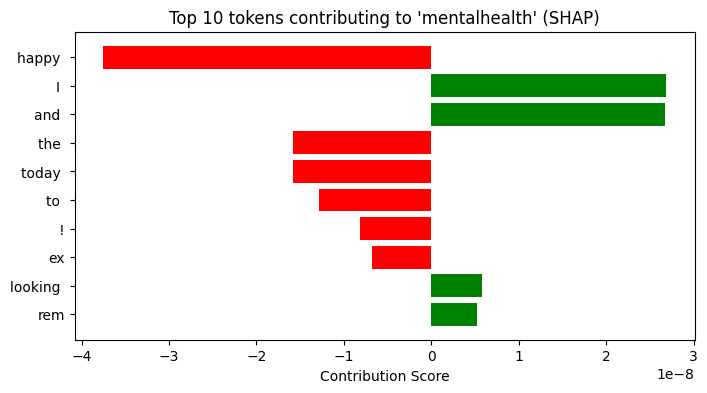


Top contributing tokens (SHAP textual explanation):
  - 'happy ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'I ' supports prediction of 'mentalhealth' (score=0.000)
  - 'and ' supports prediction of 'mentalhealth' (score=0.000)
  - 'the ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'today ' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'to ' opposes prediction of 'mentalhealth' (score=-0.000)
  - '!' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'ex' opposes prediction of 'mentalhealth' (score=-0.000)
  - 'looking ' supports prediction of 'mentalhealth' (score=0.000)
  - 'rem' supports prediction of 'mentalhealth' (score=0.000)

✅ Summary: The model predicts 'mentalhealth' with 36.40% confidence.



In [15]:
explain_prediction_dl("""
I am exremely happy today and looking forward to the future!
""", mode="both")